<h1>Using SHAP for measuring the contirbution from the features</h1>

This notebook is provided to show the usage of SHAP for measuring the contirbution from the features.

NOTE: The script used 3rd module <a href=https://github.com/slundberg/shap>SHAP</a> for feature measuring and <a href=https://logomaker.readthedocs.io/en/latest/examples.html>Logo maker</a> for LOGO figure plotting.

<h2>1. Preparation</h2>

In this notebook, few packages are necessary. 

Assuming that we are in <b>'root-of-autoBioSeqpy/notebook'</b>, then we need to add the search path and import the modules.

Please install <b>logomaker, SHAP, matplotlib, tensorFlow and keras</b> before using this notebook.

In [1]:
import os, sys
sys.path.append('../tool/libs')
sys.path.append('../')
oriPath = os.path.curdir
import paraParser
import moduleRead
import dataProcess
#import analysisPlot
import numpy as np
#from sklearn.metrics import accuracy_score,f1_score,roc_auc_score,recall_score,precision_score,confusion_matrix,matthews_corrcoef 
import tensorflow as tf
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior() 
from utils import TextDecorate, evalStrList
# from keras.models import Model
# from keras.models import Sequential

# import umap
# import umap.plot
# import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = '-1' #if CUDA related error occured, uncomment this line

Before using SHAP, we need the model and the data.

<h3>1.1 Model building</h3>

Like the binary case, using running.py  could build a model:

<b>python running.py --dataType dna --dataEncodingType onehot --dataTrainFilePaths examples/CRISPRCas9guideefficiency/data/Doench_high_activity_sgRNA.txt examples/CRISPRCas9guideefficiency/data/Doench_low_activity_sgRNA.txt --dataTrainLabel 1 0 --dataSplitScale 0.8 --modelLoadFile examples/CRISPRCas9guideefficiency/model/DNA_CNN2D_model.py --verbose 1 --outSaveFolderPath tmpOut --savePrediction 1 --saveFig 1 --batch_size 25 --epochs 40 --shuffleDataTrain 1 --spcLen 30 --firstKernelSize 4 5 --modelSaveName tmpMod.json --weightSaveName tmpWeight.bin --noGPU 0 --paraSaveName parameters.txt
</b>

The outputs will be saved at <b>../tmpOut</b>, including the parameters, the path of the data and constructure of the model.

If users would like to use their own model, please don't forget to save the model and the weight by using parameters "--modelSaveName" and "--weightSaveName".

<h3>1.2 Parameter pasering and data loading</h3>
The parameters are saved in <b>../tmoOut/parameters.txt</b>, we can get the information easily by using the <b>paraParser</b> module.

In [3]:
paraFile = '../tmpOut/parameters.txt'
paraDict = paraParser.parseParametersFromFile(paraFile)
#print
for k in paraDict:
    print('%r: %r' %(k,paraDict[k]))

'dataType': ['protein', 'other', 'other', 'other', 'other']
'dataEncodingType': ['onehot', 'other', 'other', 'other', 'other']
'spcLen': [1000, 1000, 1000, 1000, 1000]
'firstKernelSize': []
'dataTrainFilePaths': ['./examples/EnsembleDL-AlgPro/data/trpos2840.txt', './examples/EnsembleDL-AlgPro/data/trneg2840.txt', './examples/EnsembleDL-AlgPro/data/trpo-DFMCA_PSSM.txt', './examples/EnsembleDL-AlgPro/data/trne-DFMCA_PSSM.txt', './examples/EnsembleDL-AlgPro/data/trpo-dpc_pssm.txt', './examples/EnsembleDL-AlgPro/data/trne-dpc_pssm.txt', './examples/EnsembleDL-AlgPro/data/trpo-pssm400.txt', './examples/EnsembleDL-AlgPro/data/trne-pssm400.txt', './examples/EnsembleDL-AlgPro/data/trpo-single_Average.txt', './examples/EnsembleDL-AlgPro/data/trne-single_Average.txt']
'dataTrainLabel': [1, 0, 1, 0, 1, 0, 1, 0, 1, 0]
'dataTestFilePaths': ['./examples/EnsembleDL-AlgPro/data/tepos710.txt', './examples/EnsembleDL-AlgPro/data/teneg710.txt', './examples/EnsembleDL-AlgPro/data/tepo-DFMCA_PSSM.txt', './

Then using <b>predicting</b> module could help us get the model and the datasets.

In [4]:
import predicting

Here we need some modification to specify the dataset due to the layer plotting needs the training dataset.

In [5]:
paraDict['dataTestFilePaths'] = paraDict['dataTrainFilePaths']
paraDict['dataTestModelInd'] = paraDict['dataTrainModelInd']
paraDict['dataTestLabel'] = paraDict['dataTrainLabel']

In [6]:
os.chdir('../')#to the root path of autoBioSeqpy

In [7]:
predictedLabel,predicted_Probability,testNameLists,testDataMats,testLabelArr,model = predicting.predict(paraDict)    

Enconding protein data for model 0 ...
Reading CSV-like data for model 1 ...
Reading CSV-like data for model 2 ...
Reading CSV-like data for model 3 ...
Reading CSV-like data for model 4 ...
Checking the number of test files, which should be larger than 1 (e.g. at least two labels)...
Begin to generate test dataset...
Test datasets generated.
begin to prepare model...
Checking module file for modeling
Loading module and weight file
Building model...
Building model...
Building model...
Building model...
Building model...
Module loaded, generating the summary of the module
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 reshape_input (InputLayer)  [(None, 20000)]              0         []                            
                                                                                                  
 reshape (R

Please note that the test label will NOT used for predicting, thus we have to generate it manually.

In [8]:
featureGenerators = []
dataTypeList = paraDict['dataType']
verbose = False
dataEncodingType = paraDict['dataEncodingType']
KMerNumList = useKMerList = [False] * 400
dataTestFilePaths = paraDict['dataTestFilePaths']
modelLoadFile = paraDict['modelLoadFile']
dataTestModelInd = paraDict['dataTestModelInd']
spcLen = paraDict['spcLen']
for i,subDataType in enumerate(dataTypeList):
    if subDataType.lower() == 'protein':
        if verbose:
            td.printC('Enconding protein data for model %d ...' %i,'b')
        featureGenerator = dataProcess.ProteinFeatureGenerator(dataEncodingType[i], useKMer=useKMerList[i], KMerNum=KMerNumList[i])
    elif subDataType.lower() == 'dna':
        if verbose:
            td.printC('Enconding DNA data for model %d ...' %i,'b')
        featureGenerator = dataProcess.DNAFeatureGenerator(dataEncodingType[i], useKMer=useKMerList[i], KMerNum=KMerNumList[i])
    elif subDataType.lower() == 'rna':
        if verbose:
            td.printC('Enconding RNA data for model %d ...' %i,'b')
        featureGenerator = dataProcess.RNAFeatureGenerator(dataEncodingType[i], useKMer=useKMerList[i], KMerNum=KMerNumList[i])
    elif subDataType.lower() == 'other':
        if verbose:
            td.printC('Reading CSV-like data for model %d ...' %i,'b')
        featureGenerator = dataProcess.OtherFeatureGenerator()
    else:
        td.printC('Unknow dataType %r, please use \'protein\', \'dna\' ,\'rna\' or \'other\'' %subDataType, 'r')
    featureGenerators.append(featureGenerator)
    assert subDataType.lower() in ['protein','dna','rna','other']

if verbose:
    td.printC('Checking the number of test files, which should be larger than 1 (e.g. at least two labels)...','b')
assert len(dataTestFilePaths) > 0

if verbose:
    td.printC('Begin to generate test dataset...','b')

testDataLoadDict = {}    
for modelIndex in range(len(modelLoadFile)):
    testDataLoadDict[modelIndex] = []
#    testDataLoaders = []
for i,dataPath in enumerate(dataTestFilePaths):
    if i >= len(dataTestModelInd):
        modelIndex = 0
    else:
        modelIndex = dataTestModelInd[i]
    featureGenerator = featureGenerators[modelIndex]
    dataLoader = dataProcess.DataLoader(label = paraDict['dataTestLabel'][i], featureGenerator=featureGenerator)
    dataLoader.readFile(dataPath, spcLen = spcLen[modelIndex])
    testDataLoadDict[modelIndex].append(dataLoader)

testDataMats = []
testLabelArrs = []
testNameLists = []
for modelIndex in range(len(modelLoadFile)):
    testDataLoaders = testDataLoadDict[modelIndex]
    testDataSetCreator = dataProcess.DataSetCreator(testDataLoaders)
    testDataMat, testLabelArr, nameList = testDataSetCreator.getDataSet(toShuffle=False, withNameList=True)
    testDataMats.append(testDataMat)
    testLabelArrs.append(testLabelArr)
    testNameLists.append(nameList)
if verbose:
    td.printC('Test datasets generated.','g')
nameTemp = testNameLists[0]    
testDataMats, testLabelArrs, sortedIndexes = dataProcess.matAlignByName(testDataMats,nameTemp,testLabelArrs,testNameLists)
testNameLists = [nameTemp] * len(testNameLists)

tmpTempLabel = testLabelArrs[0]

Few printing operations for display the current information.

In [9]:
testLabelArr.shape

(5680,)

In [10]:
print('%d matrix generated:\n' %(len(testDataMats)))
for i in range(len(testDataMats)):
    print('Matrix and label %d:' %i)
    print(testDataMats[i],testDataMats[i].shape)
    print(testLabelArrs[i])
    print('\n')

5 matrix generated:

Matrix and label 0:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]] (5680, 20000)
[1 1 1 ... 0 0 0]


Matrix and label 1:
[[1.21   0.3235 0.9522 ... 0.213  0.2766 0.6476]
 [2.2973 0.8474 1.1554 ... 0.098  0.2544 0.4287]
 [1.4323 0.9144 1.6108 ... 0.6721 0.5209 0.865 ]
 ...
 [1.4677 1.2113 1.6381 ... 0.9131 0.6868 0.9778]
 [1.8283 0.8568 0.8452 ... 0.4027 0.5085 0.867 ]
 [1.1383 0.4958 0.9618 ... 0.5645 0.4889 0.7659]] (5680, 210)
[1 1 1 ... 0 0 0]


Matrix and label 2:
[[ 0.6981  1.6855  1.2138 ...  2.3459  1.044   1.2013]
 [ 1.2689 -0.395  -0.6723 ...  3.2017  1.3025  0.8067]
 [ 1.      1.3558  0.2331 ...  4.8405  0.5644  2.362 ]
 ...
 [ 0.7197  1.1297  0.7092 ...  2.431   1.1695  1.7552]
 [ 0.0763 -0.0361 -0.0482 ...  1.1044  0.1606  0.7349]
 [ 0.9531  1.3125  0.9531 ...  2.1719  2.1094  1.8906]] (5680, 400)
[1 1 1 ... 0 0 0]


Matrix and label 3:
[[ 8.6     3.2     4.     ...  0.      0.    

<h2>2 Using SHAP for feature measuring</h2>
SHAP is a good tool for understanding the contribution from the features in every sample. SHAP provides some functions for the visualization of the features, but here we only use SHAP for generating the SHAP values and then plot them in our way.

<b>Note</b>:Currently (2020.11.23) SHAP only support TF 1.x without significant issue, if change TF to 2.x, sometimes the SHAP will not work . In this work, autoBioSeqpy uses Keras with TF backend, thus please make sure the version of TF is correctly set. The model from autoBioSeqpy is compatible with both TF 1.x and 2.x and thus all the code in section 1 can be executed correctly. 

<h3>2.1 Preparation</h3>
SHAP need the TF/Torch/Keras model and the related inputs, which are generated in the last section, here just use them.

In [11]:
import shap
from tensorflow.keras.models import Model

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [12]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 reshape_input (InputLayer)  [(None, 20000)]              0         []                            
                                                                                                  
 reshape (Reshape)           (None, 1000, 20)             0         ['reshape_input[0][0]']       
                                                                                                  
 conv1d (Conv1D)             (None, 990, 250)             55250     ['reshape[0][0]']             
                                                                                                  
 conv1d_1 (Conv1D)           (None, 980, 250)             687750    ['conv1d[0][0]']              
                                                                                              

In [13]:
model.layers[0].trainable

True

In [14]:
explainer = shap.GradientExplainer(model, testDataMats)

In [15]:
shap_values = explainer.shap_values(testDataMats)

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.


In [16]:
shap_values

[[array([[ 0.00000000e+00,  7.91114552e-09, -2.91937477e-06, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [-7.89559692e-07, -2.15400178e-06,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [-1.60184044e-07, -4.07953209e-08,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         ...,
         [ 6.12741303e-07, -3.16379155e-05, -1.73240585e-06, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 1.53862999e-07, -3.11848853e-05, -1.16427344e-07, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00]]),
  array([[ 3.29429022e-05,  7.33176188e-04,  4.21502118e-05, ...,
          -2.01979521e-04,  1.07269640e-04, -3.59906371e-05],
         [-5.51629018e-05,  1.39042080e-04,  8.68970437e-06, ...,
          -1.29082124e

Here we can check the dimension of the shap values with the inputs:

In [17]:
len(shap_values)

1

In [18]:
len(shap_values[0])

5

In [19]:
for i in range(len(shap_values[0])):
    print(i,shap_values[0][i].shape)

0 (5680, 20000)
1 (5680, 210)
2 (5680, 400)
3 (5680, 400)
4 (5680, 400)


In [20]:
for i in range(len(testDataMats)):
    print(i,testDataMats[i].shape)    

0 (5680, 20000)
1 (5680, 210)
2 (5680, 400)
3 (5680, 400)
4 (5680, 400)


In [21]:
testDataLoaders = testDataLoadDict[0]

In [22]:
print(len(testDataLoaders[0].names))
print(len(testDataLoaders[1].names))

2840
2840


In [23]:
testDataLoaders[0].seqs

{'trpos2840.txt_allergen_93': 'MGVFNYETETTSVIPAARLFKAFILEGDTLIPKVAPQAISSVENIEGNGGPGTIKKITFPEGSPFKYVKERVDEVDHANFKYSYSMIEGGALGDTLEKICNEIKIVATPDGGSILKISNKYHTKGDHEMKAEHMKAIKEKGEALLRAVESYLLAHSDAYNXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

In [24]:
testDataLoaders[1].seqs

{'trneg2840.txt_non-allergen_24037': 'MKFLLLVLAALGFLTQVIPASAGGSKCVSNTPGYCRTCCHWGETALFMCNASRKCCISYSFLPKPDLPQLIGNHWQSRRRNTQRKDKKQQTTVTSXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

<h3>2.3 Visualize the SHAP values</h3>

Firstly, have a look of the format of SHAP values

In [25]:
shap_values = shap_values[0]

In [26]:
import pickle
with open('tmpShapVal.pt','wb') as FIDO:
    pickle.dump(shap_values,FIDO)

In [27]:
shap_values_modwise = None
for i in range(len(shap_values)):
    # print(i,shap_values[0][i].shape)
    if shap_values_modwise is None:
        shap_values_modwise = shap_values[i].sum(-1).reshape(-1,1)
    else:
        shap_values_modwise = np.concatenate([shap_values_modwise,shap_values[i].sum(-1).reshape(-1,1)],axis=-1)

In [28]:
shap_values_modwise

array([[ 2.48616360e-01,  9.70752146e-03,  2.34886033e-01,
         4.00965294e-02,  4.21221297e-02],
       [ 1.67988069e-01,  4.25114416e-03,  1.65233678e-01,
         2.06485793e-02,  3.84151710e-02],
       [ 1.85519831e-01,  3.50514899e-03,  4.07346730e-01,
         4.00243133e-02,  1.79376693e-02],
       ...,
       [-5.98372883e-01, -8.15536097e-03, -5.25900967e-02,
         1.51513460e-02, -2.42228443e-02],
       [-2.69374643e-01, -1.45561372e-03, -3.01206474e-01,
         1.04487143e-02, -1.52452825e-02],
       [-2.92933771e-01, -2.73205004e-04, -2.11591317e-01,
        -1.63453011e-02, -1.95132116e-02]])

In [29]:
shap_values_modwise.shape

(5680, 5)

In [30]:
tmpPosShapVal = shap_values_modwise[:2840,:].sum(0)
tmpNegShapVal = shap_values_modwise[2840:,:].sum(0)

In [31]:
print(tmpPosShapVal)
print(tmpNegShapVal)
print(tmpPosShapVal+tmpNegShapVal)

[720.47009029  12.33437838 485.89238288 117.81379344  49.96330002]
[-723.13475682  -12.45112214 -491.62913308 -119.36531893  -50.41072633]
[-2.66466653 -0.11674376 -5.7367502  -1.55152549 -0.44742631]


In [32]:
from matplotlib import pyplot as plt

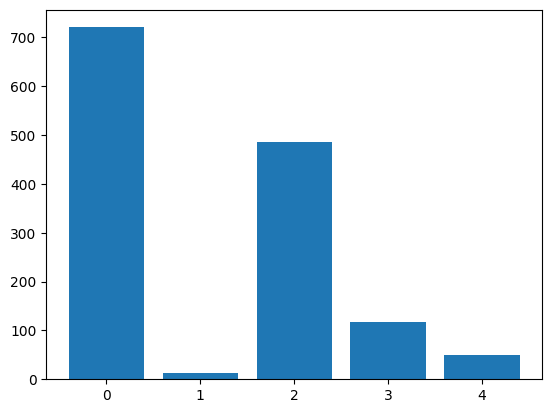

In [33]:
plt.bar(np.arange(5),tmpPosShapVal)
plt.show()

In [34]:
print(len(shap_values))

5


In [35]:
print(shap_values[0].shape)

(5680, 20000)


In this work, the length of the sequence is set as 1500 and every sample has additional 420 features. Thus, it is clear that SHAP will score all the features of every samples respectively.

Now we can plot them separately, here is the plot of SHAP values of the sequences:

In [36]:
import analysisPlot

In [37]:
print(shap_values[0][0].shape)
print(shap_values[0][1].shape)

(20000,)
(20000,)


In [38]:
matForPlot = shap_values[0]

Since the SHAP values in a sample is comparable, a 0-1 scale is performed for every sample to make the plot better to look.

In [39]:
matForPlot = (matForPlot - matForPlot.min(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]]))) / (matForPlot.max(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]])) - matForPlot.min(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]])))

Please note that the 120 below is the length (i.e. 30) * onehot dimesion (i.e. 4)

In [40]:
matForPlot.shape

(5680, 20000)

FixedFormatter should only be used together with FixedLocator


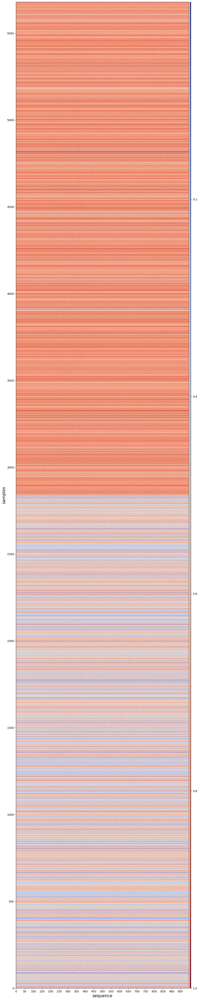

In [41]:
analysisPlot.showMatWithVal(matForPlot[:,:1000],showText=False,figSize=(32,64),cmapName='coolwarm',
                            yticks=np.arange(0,5680,500),ytickLabels=np.arange(0,5680,500),
                           xticks=np.arange(0,1000,50),xtickLabels=np.arange(0,1000,50),
                           xtitle='sequence',ytitle='samples',title_size=15,stick_size=10,
                            saveFig='./tmpOut/shapVal.pdf',saveDpi=300)

Sometimes the global vision is not enouph for figure out what happend in one or few samples, thus here we provided few cells to make detailed comarison:

In [42]:
#this function is to get the fasta seqs from the dataLoader
def getSampleSeqs(sampleIndex,testDataLoadDict):
    thres = len(testDataLoadDict[0][0].names)
    names = []
    outList = []
    for sampleID in sampleIndex:
        if sampleID < thres:
            label = 1
        else:
            label = 0
            sampleID = sampleID - thres
        dataLoader = testDataLoadDict[0][label]
        name = dataLoader.names[sampleID]
        seq = dataLoader.seqs[name]
        names.append(name)
        outList.append(list(seq))
    return np.array(outList,dtype=str),names



In [43]:
help(analysisPlot.showMatWithText)

Help on function showMatWithText in module analysisPlot:

showMatWithText(matIn, textMat, figSize=(16, 10), fontsize=10, precision='%.3f', vmin=1e-07, xtitle=None, xticks=None, xtickLabels=None, ytitle=None, yticks=None, ytickLabels=None, colorBarTitle=None, xlim=None, ylim=None, toInvert=True, saveFig=None, saveDpi=300, showText=True, color_bar_set_under=(0, 0, 0, 0), vmax=None, color_bar_set_over=None, cmapName='jet', extent=None, stick_size=None, title_size=None, norm=None, driverCaxSize=0.05, driverCaxPad=0.05, xtickRotation=None, showFig=True)



FixedFormatter should only be used together with FixedLocator


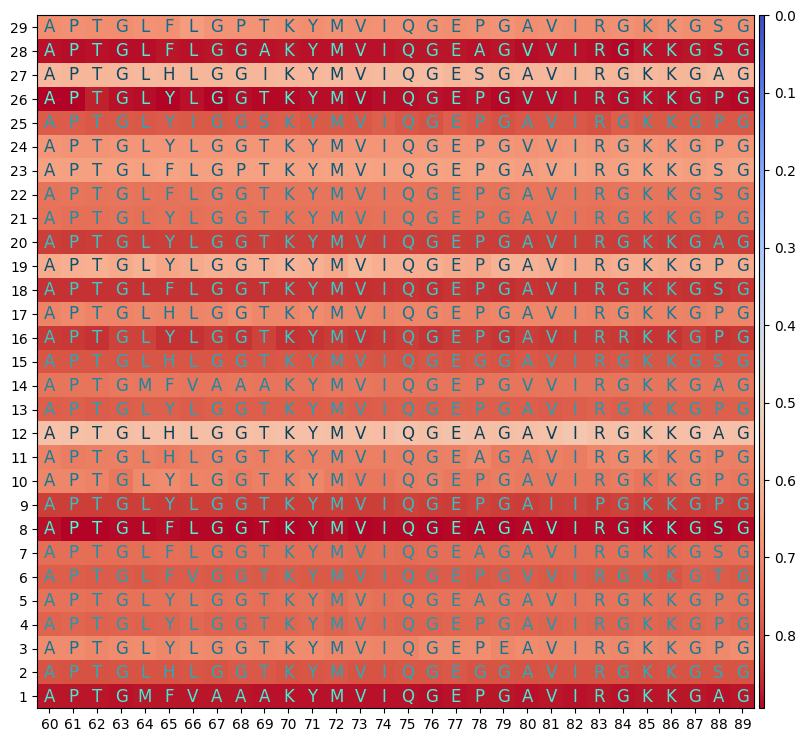

In [44]:
matForPlot = shap_values[0]
matForPlot = (matForPlot - matForPlot.min(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]]))) / (matForPlot.max(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]])) - matForPlot.min(axis=1).reshape(matForPlot.shape[0],1).dot(np.ones([1,matForPlot.shape[1]])))

sampleIndex = [2937,3061,3139,3364,3381,3521,3751,3892,3921,4084,4150,4181,4251,4322,4362,4599,4676,4729,4902,4907,4947,4970,5080,5138,5347,5380,5575,5584,5645] #the rows in the matForPlot
fastaSeqs,names = getSampleSeqs(sampleIndex,testDataLoadDict)
subShapVals = matForPlot[sampleIndex,:].reshape([len(sampleIndex),-1,20]).mean(axis=-1) #simply use the average to measure the contirbution

startPos = 60 #start from 0
endPos = 90
part = slice(startPos,endPos)
#analysisPlot.showMatWithText(subShapVals[:,part],fastaSeqs[:,part],vmin=-1e-5,cmapName='coolwarm',
#                            xtickLabels = np.arange(startPos,endPos), ytickLabels=names,fontsize=20,
#                            xtitle='position of the sequences',title_size=12,stick_size=20,figSize=(16,9))
analysisPlot.showMatWithText(subShapVals[:,part],fastaSeqs[:,part],vmin=-1e-5,cmapName='coolwarm',
                            fontsize=12,
                            figSize=(16,9),xtickLabels = np.arange(startPos,endPos),stick_size=10,saveFig=f'./tmpOut/11.pdf',saveDpi=300)

In [45]:
# windowSize = 10
matForPlot = shap_values[0][:2840,:].reshape(2840,-1,20).sum(-1)
bestPos_window = matForPlot.argmax(axis=-1)
# matForPlot = matForPlot.sum(axis=-1)
# matForPlot_window = []
# currPos = 0
# while currPos + windowSize < matForPlot.shape[1]:
#     matForPlot_window.append(matForPlot[:,currPos:currPos + windowSize].sum(-1,keepdims=True))
#     currPos += 1
# matForPlot_window = np.concatenate(matForPlot_window,axis=-1)
# bestPos_window = matForPlot_window.argmax(axis=-1)

In [46]:
bestPos_window

array([125,  38, 112, ..., 117,  91,  49], dtype=int64)

In [47]:
windowSize = 20
with open('motifTest.csv','w') as FIDO:
    FIDO.write('midPos,name,seq\n')
    for p,n in zip(bestPos_window,testDataLoaders[0].names):
        seq = testDataLoaders[0].seqs[n]
        sPos = max([p - windowSize,0])
        ePos = min([p + windowSize+1,len(seq)])
        #print(p,n,seq[sPos:ePos])
        FIDO.write(f'{p},{n},{seq[sPos:ePos]}\n')

In [92]:
help(analysisPlot.showMatWithVal)

Help on function showMatWithVal in module analysisPlot:

showMatWithVal(matIn, figSize=(16, 10), fontsize=10, precision='%.3f', vmin=1e-07, xtitle=None, xticks=None, xtickLabels=None, ytitle=None, yticks=None, ytickLabels=None, colorBarTitle=None, xlim=None, ylim=None, toInvert=True, saveFig=None, saveDpi=300, showText=True, color_bar_set_under=(0, 0, 0, 0), vmax=None, color_bar_set_over=None, cmapName='jet', extent=None, stick_size=None, title_size=None, norm=None, driverCaxSize=0.05, driverCaxPad=0.05, xtickRotation=None, showFig=True, fontColor=None, figTitle=None, figTitleSize=None)



FixedFormatter should only be used together with FixedLocator


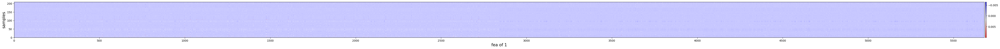

FixedFormatter should only be used together with FixedLocator


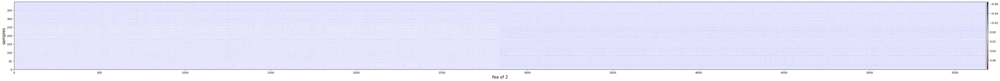

FixedFormatter should only be used together with FixedLocator


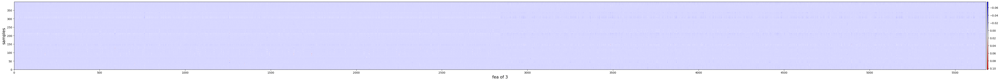

FixedFormatter should only be used together with FixedLocator


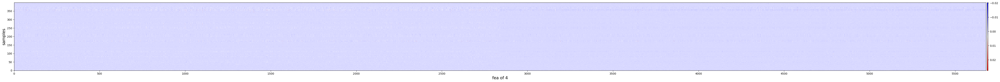

In [104]:
# idx = 2
for idx in range(1,len(shap_values)):
    tmpVal = shap_values[idx]
#     tmpVal = np.sign(tmpVal) * np.log1p(np.abs(tmpVal))
    tmpVal = tmpVal.T
    analysisPlot.showMatWithVal(tmpVal,showText=False,figSize=(64,16),cmapName='bwr',vmin=None,
                                yticks=np.arange(0,tmpVal.shape[0],50),ytickLabels=np.arange(0,tmpVal.shape[0],50),
                               xticks=np.arange(0,tmpVal.shape[1],500),xtickLabels=np.arange(0,tmpVal.shape[1],500),
                               xtitle=f'fea of {idx}',ytitle='samples',title_size=15,stick_size=10,
                                saveFig=f'./tmpOut/shapVal{idx}.pdf',saveDpi=300)

FixedFormatter should only be used together with FixedLocator


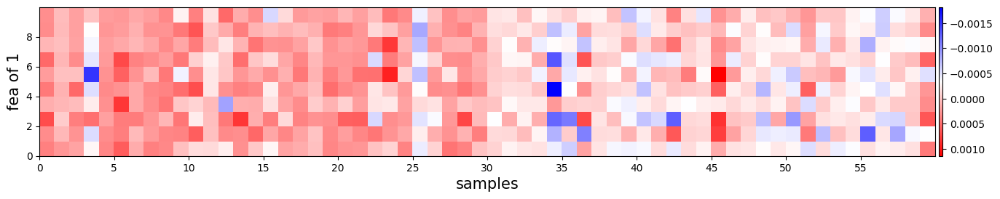

FixedFormatter should only be used together with FixedLocator


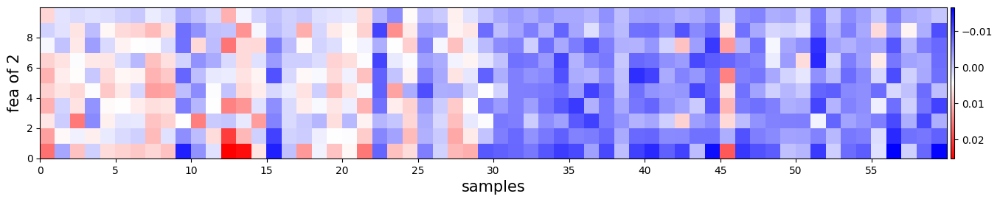

FixedFormatter should only be used together with FixedLocator


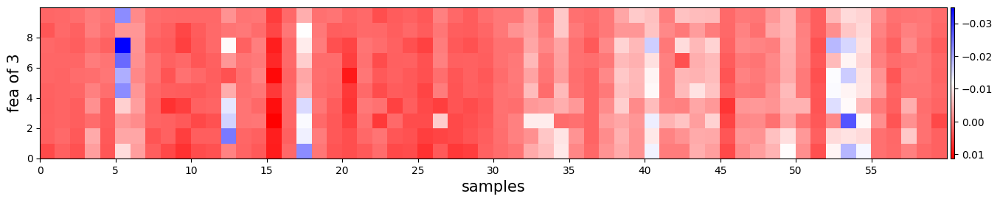

FixedFormatter should only be used together with FixedLocator


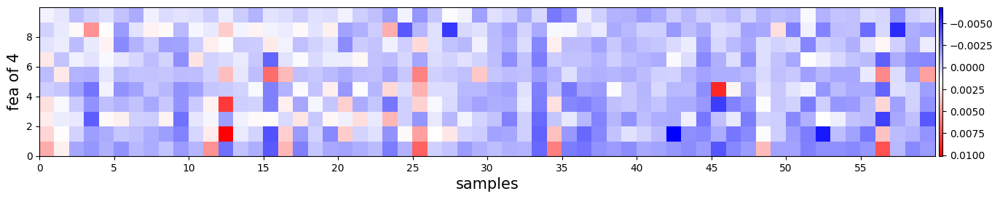

In [211]:
topKNum = 10
for idx in range(1,len(shap_values)):
    tmpVal = shap_values[idx]
    tmpValPos = tmpVal[:2820,:]
    tmpValNeg = tmpVal[2820:,:] * -1
    tmpSum = tmpValPos.sum(0) + tmpValNeg.sum(0)
    posArr = tmpSum.argsort()[::-1]
    selectedPos = posArr[:topKNum]
    filteredVal = tmpVal[:,selectedPos]
    tmpVal = filteredVal.T
    tmpVal = np.concatenate([tmpVal[:,:30],tmpVal[:,-30:]],axis=-1)
    analysisPlot.showMatWithVal(tmpVal,showText=False,figSize=(16,9),cmapName='bwr',vmin=None,
                                yticks=np.arange(0,tmpVal.shape[0],2),ytickLabels=np.arange(0,tmpVal.shape[0],2),
                               xticks=np.arange(0,tmpVal.shape[1],5),xtickLabels=np.arange(0,tmpVal.shape[1],5),
                               ytitle=f'fea of {idx}',xtitle='samples',title_size=15,stick_size=10,
                                saveFig=f'./tmpOut/filteredShapVal{idx}.pdf',saveDpi=300)

In [219]:
posArr

array([357, 353,   4, 358, 250, 168, 112, 178,  80, 201, 324, 253, 331,
       371, 245, 184, 273, 179, 306, 377, 365, 176, 361, 173, 258,  89,
       259, 355, 356,  54, 277,  47, 110, 162, 278,  96,   1, 249, 252,
       121, 374,  66, 221,  38, 236, 266, 170, 109, 346,  22, 394, 282,
       241, 203, 198, 295,  17, 128, 254,  41, 366, 367, 304, 161, 115,
       126, 294,  81, 127,  95, 303, 285, 344, 244, 190, 240, 256, 376,
         3, 347,  53, 107, 117, 318, 339,  75, 160,  48, 398, 134, 330,
       381, 206, 279, 289, 144, 360, 130, 328, 172, 216, 337, 153, 396,
       265, 230,  30,  57, 390, 239, 370, 271, 302, 280, 108, 373, 255,
       257, 214, 269, 305,  91, 114, 317, 207,  45,  63,  92, 260, 243,
        51,  33,  27, 382, 131,  40, 204, 186,   9, 158, 378, 385,  90,
       275, 312, 113, 263,  60,  59,  62, 261, 223,  26,  18, 281, 135,
        83, 148, 100, 194,  58,  93, 368, 205,  99, 220, 310,  50, 213,
       300, 202, 251, 307, 335, 321,  86, 116,   5,  85,  65, 12

In [216]:
tmpVal = shap_values[idx]

In [217]:
tmpVal[:2820,:].sum(0)[posArr]

array([ 3.11525280e+00,  2.88456719e+00,  1.78406748e+00,  1.73350752e+00,
        1.45230815e+00,  1.40516989e+00,  1.17943961e+00,  1.11409393e+00,
        1.11303694e+00,  9.97107804e-01,  9.62527946e-01,  8.57617351e-01,
        8.59397840e-01,  8.05910718e-01,  7.43753343e-01,  7.27850029e-01,
        7.28915295e-01,  6.66996161e-01,  6.64332204e-01,  6.44339438e-01,
        6.58571376e-01,  6.05081250e-01,  6.25871795e-01,  6.00928755e-01,
        5.91707602e-01,  5.32344962e-01,  5.32522700e-01,  5.10220143e-01,
        4.88883656e-01,  5.14260242e-01,  5.13173765e-01,  4.88216376e-01,
        5.06602061e-01,  4.91598852e-01,  4.83920757e-01,  4.71209200e-01,
        4.73359891e-01,  4.59786434e-01,  4.59141289e-01,  4.53610053e-01,
        4.49343890e-01,  4.28167275e-01,  4.21842178e-01,  4.30156309e-01,
        4.12272759e-01,  4.15722879e-01,  4.10143167e-01,  4.04820937e-01,
        3.81985118e-01,  3.90338139e-01,  3.83343527e-01,  3.81985564e-01,
        3.74511237e-01,  

In [218]:
tmpVal[2820:,:].sum(0)[posArr]

array([-3.15461574e+00, -2.90081434e+00, -1.79859420e+00, -1.73760725e+00,
       -1.45506735e+00, -1.43255717e+00, -1.17209377e+00, -1.15500326e+00,
       -1.13610890e+00, -9.87486721e-01, -9.87952510e-01, -8.68795610e-01,
       -8.55153535e-01, -7.79475980e-01, -7.25523609e-01, -7.32046121e-01,
       -7.26238997e-01, -6.68887741e-01, -6.53766584e-01, -6.60922421e-01,
       -6.24330845e-01, -6.45304187e-01, -6.15476124e-01, -6.17058712e-01,
       -5.93891133e-01, -5.37837285e-01, -5.26470700e-01, -5.33151177e-01,
       -5.40919739e-01, -5.11633114e-01, -5.11125327e-01, -5.28141737e-01,
       -4.80955363e-01, -4.72629553e-01, -4.77845225e-01, -4.83438526e-01,
       -4.78438748e-01, -4.58631080e-01, -4.55999320e-01, -4.46863286e-01,
       -4.32810105e-01, -4.29202180e-01, -4.20632728e-01, -4.05869096e-01,
       -4.10053336e-01, -4.03831642e-01, -4.09411271e-01, -4.02308967e-01,
       -4.04472834e-01, -3.90937005e-01, -3.79029332e-01, -3.65419763e-01,
       -3.63151399e-01, -

In [222]:
posShapVal = tmpVal[:2820,:].sum(0)
negShapVal = tmpVal[2820:,:].sum(0)
seqNum = np.arange(tmpVal.shape[1])
# print(list(zip(seqNum,posShapVal,negShapVal)))
with open('tmpShapValFea.csv','w') as FIDO:
    for s,p,n in zip(seqNum,posShapVal,negShapVal):
        FIDO.write(f'{s},{p},{n}\n')

In [121]:
feaLen = 0
for idx in range(len(shap_values)):
    feaLen += shap_values[idx].shape[1]

In [160]:
corMatPos = np.zeros([feaLen,feaLen])
corMatNeg = np.zeros([feaLen,feaLen])
topKNum = 100
tmpRef = np.concatenate(shap_values,axis=-1)
for rNum,r in enumerate(tmpRef):
    posP = r.argsort()[::-1][:topKNum]
    for i in range(topKNum-1):
        pos_i = posP[i]
        for j in range(i,topKNum):
            pos_j = posP[j]
            corMatPos[pos_i,pos_j] += 1
            corMatPos[pos_j,pos_i] += 1
    posN = (r*-1).argsort()[::-1][:topKNum]
    for i in range(topKNum-1):
        pos_i = posN[i]
        for j in range(i,topKNum):
            pos_j = posN[j]
            corMatNeg[pos_i,pos_j] += 1
            corMatNeg[pos_j,pos_i] += 1
    print(f'{rNum+1}/{tmpRef.shape[0]}',end='\r')
    
                

In [161]:
corMatPos.max()

4348.0

In [162]:
corMatPos.min()

0.0

In [169]:
analysisPlot.showMatWithVal(corMatPos,showText=False,figSize=(8,8),cmapName='rainbow',vmin=1e-7,
                                yticks=np.arange(0,feaLen,4000),ytickLabels=np.arange(0,feaLen,4000),
                               xticks=np.arange(0,feaLen,4000),xtickLabels=np.arange(0,feaLen,4000),
                               xtitle='feaNum',ytitle='feaNum',title_size=15,stick_size=10,
                                saveFig='./tmpOut/corMatPos.pdf',saveDpi=300)

MemoryError: Unable to allocate 3.42 GiB for an array with shape (21410, 21410) and data type float64

Error in callback <function _draw_all_if_interactive at 0x000001BC85981430> (for post_execute):


MemoryError: Unable to allocate 3.42 GiB for an array with shape (21410, 21410) and data type float64

MemoryError: Unable to allocate 3.42 GiB for an array with shape (21410, 21410) and data type float64

<Figure size 800x800 with 2 Axes>

In [ ]:
analysisPlot.showMatWithVal(corMatNeg,showText=False,figSize=(8,8),cmapName='rainbow',vmin=1e-7,
                                yticks=np.arange(0,feaLen,4000),ytickLabels=np.arange(0,feaLen,4000),
                               xticks=np.arange(0,feaLen,4000),xtickLabels=np.arange(0,feaLen,4000),
                               xtitle='feaNum',ytitle='feaNum',title_size=15,stick_size=10,
                                saveFig='./tmpOut/corMatPos.pdf',saveDpi=300)

In [49]:
tmpValPosSort = tmpVal[:2820,:].sum(0).argsort()[::-1]
tmpValNegSort = (tmpVal[2820:,:]*-1).sum(0).argsort()[::-1]

In [50]:
print(tmpVal[:2820,:].sum(0)[tmpValPosSort[:topKNum]])
print(tmpVal[2820:,:].sum(0)[tmpValNegSort[:topKNum]])

[15.99595226 12.01502812 10.38018483 10.16042876  9.26158285  8.90267118
  7.66304187  6.72538907  6.62483532  6.49934819]
[-16.06084602 -11.93569899 -10.2984619  -10.18738319  -9.36634788
  -8.81430162  -7.73811072  -6.73694294  -6.69918251  -6.52989059]


<h3>2.4 Visualize the SHAP using LOGO figure</h3>

Using the shap values we can plot the LOGO figure with module Logo maker, below are few demostration of the way generating the plots.

<h4>2.4.1 Preparation</h4>
Before plotting, we have to generate the data frame provided by pandas, which illustrate the relations between the alphabets and the values. Here we provide a class for the such things：<br>
1. Setting the position of the letters (i.e. the posDict).<br>
2. Add the shap values to the right position.<br>
3. Generate the data frame afterwards.<br>

Please note that if you don't want to provide the posDict manually, we provided a default one (i.e. the <i><b>self.posDict</b></i>) for <b>DNA</b> in this notebook, be sure the letters are the things you need, and you can change the default one as well.

In [51]:
import pandas as pd
import logomaker

In [52]:
class seqLogoPlot():
    def __init__(self,posDict=None,encodingType='oneHot'):
        if not posDict is None:
            self.posDict = posDict
        else:
            self.posDict = {'A':0,'G':1,'C':2,'T':3}
        self.posMatDict = {} #pos:resArr
        self.dim = len(list(self.posDict.keys()))
        self.colNames = ['']*self.dim
        for k in self.posDict:
            self.colNames[self.posDict[k]] = k
        self.encodingType = encodingType
        
    def addSeqWithVal(self,seq,vals,posList=None):
        if posList is None:
            posList = np.arange(len(seq),dtype=int)
        if self.encodingType == 'oneHot':
            for i,pos in enumerate(posList):
                if not pos in self.posMatDict:
                    self.posMatDict[pos] = np.zeros(self.dim,dtype=float)
#                 print(self.posMatDict[pos])
#                 print(vals[i])
                #self.posMatDict[pos][self.posDict[seq[i]]] += vals[i]
                self.posMatDict[pos] += vals[i]
        else:
            for i,pos in enumerate(posList):
                if not pos in self.posMatDict:
                    self.posMatDict[pos] = np.zeros(self.dim,dtype=float)
                resPos = self.posDict[seq[i]]
                self.posMatDict[pos][resPos] += vals[i]
            
    def generateDF(self):
        matList = []
        for pos in range(np.max(list(self.posMatDict.keys()))+1):
            matList.append(self.posMatDict[pos])
        outDF = pd.DataFrame(data=matList,  columns=self.colNames)
        outDF.index.name='pos'
        return outDF

In [53]:
def feedSeqs(dataLoader,vals,seqLogoPlotObj):
    for sampleID in range(len(dataLoader.seqs)):
        name = dataLoader.names[sampleID]
        seq = dataLoader.seqs[name]
#         print(len(seq))
        val = vals[sampleID]
        seqLogoPlotObj.addSeqWithVal(seq,val)


In [54]:
tmpObjPos = seqLogoPlot()
numRows = len(testDataLoaders[0].names)
feedSeqs(testDataLoaders[0],shap_values[0][:numRows,:].reshape(numRows,-1,4),tmpObjPos)

In [55]:
testDataLoadDict

{0: [<dataProcess.DataLoader at 0x1bcc97209a0>,
 1: [<dataProcess.DataLoader at 0x1bcb93a8310>,
 2: [<dataProcess.DataLoader at 0x1bcb93af9a0>,
 3: [<dataProcess.DataLoader at 0x1bcb93a49a0>,
 4: [<dataProcess.DataLoader at 0x1bcc97208b0>,
  <dataProcess.DataLoader at 0x1bcc9720730>]}

In [56]:
crp_df = tmpObjPos.generateDF()

In [57]:
crp_df

,A,G,C,T
pos,,,,
0,0.004950,0.003863,0.005780,-0.002588
1,0.000969,0.000601,0.003597,0.000635
2,0.000099,0.001851,-0.000516,0.002678
3,0.088793,0.002592,0.000743,0.003915
4,-0.000200,0.009191,-0.004778,0.000378
...,...,...,...,...
995,0.053175,0.057554,0.030691,0.209737
996,0.031422,-0.013459,0.120210,0.044644
997,0.037981,0.001300,0.070251,-0.017775


<h4>2.4.2 plotting the LOGO figure</h4>
Please note that, in this example, the length of the protein is 1500, which is too long to plot all the LOGOs in one figure, thus here we only use the first 30 residues for plotting.

<h5>2.4.2.1 general plotting</h5>
Here we can use the code provide by Loge maker for the first plotting. Somehow the information seems too much.

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


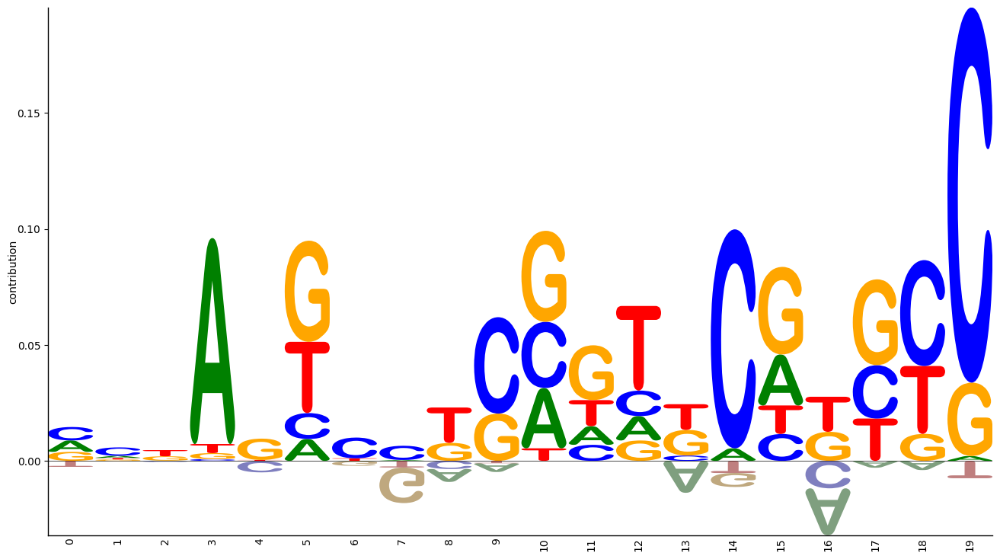

In [58]:
crp_logo = logomaker.Logo(crp_df.iloc[:20,:],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                         figsize=(16,9))

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)

# style using Axes methods
crp_logo.ax.set_ylabel("contribution", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)

# style and show figure
crp_logo.fig.show()

<h5>2.4.2.2 plotting with threshold</h5>
To reduce the less important information, here we set a threhold for filtering.

In [59]:
global_threshold = 0.01
crp_df1 = crp_df.copy()
crp_df1.iloc[crp_df1<global_threshold] = 0

DataFrame indexer for .iloc is deprecated and will be removed in a future version.
consider using .loc with a DataFrame indexer for automatic alignment.


Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


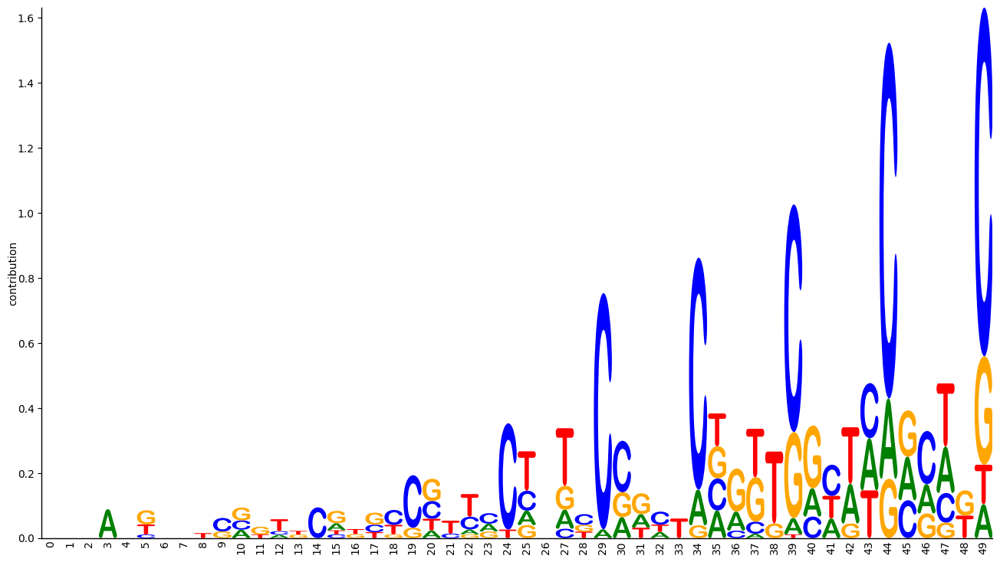

In [60]:
crp_logo = logomaker.Logo(crp_df1.iloc[:50,:],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                         figsize=(16,9))

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)

# style using Axes methods
crp_logo.ax.set_ylabel("contribution", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)

# style and show figure
crp_logo.fig.show()

<h5>2.4.2.3 plotting with row wise scaling</h5>
Similarily, we can scale the values of every row (i.e. every residue) into [-1,1], which can make the filtering different.

In [60]:
global_threshold = 0.2
crp_df2 = crp_df.copy()
# crp_df2.iloc[crp_df2<global_threshold] = 0
for i in range(crp_df2.shape[0]):
    tmpArr = crp_df2.copy().iloc[i,:]
    if np.max(tmpArr)-np.min(tmpArr) == 0:
        continue
    crp_df2.iloc[i,:] = ((tmpArr-np.min(tmpArr)) / (np.max(tmpArr)-np.min(tmpArr)) - 0.5) / 2

# crp_df2 = ((diff / scale) - 0.5) / 2
crp_df2[crp_df2.abs()<global_threshold] = 0

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


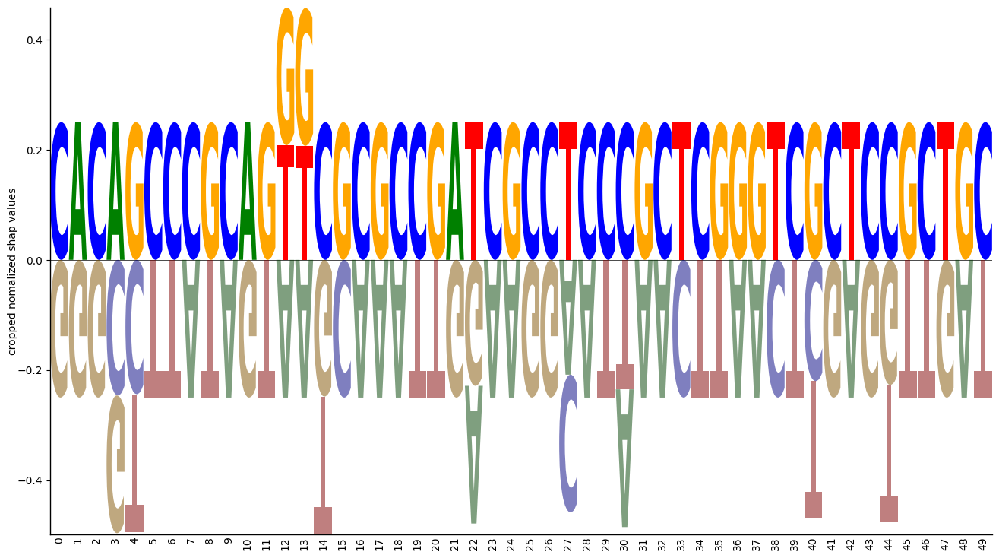

In [61]:
crp_logo = logomaker.Logo(crp_df2.iloc[:50,:],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                         figsize=(16,9))

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)

# style using Axes methods
crp_logo.ax.set_ylabel("cropped nomalized shap values", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)



# style and show figure
crp_logo.fig.show()

<h5>2.4.2.4 plotting with row wise softmax</h5>
Finally, we would like to show the widely used nomalization in deep learning named 'softmax': $$ \dfrac{x_i}{\sum_{j} exp(x_j)} $$<br>
Additionally, the threshold is set to 0.25, which is the average of 4 elements with sum of 1.

In [62]:
global_threshold = 1/4
crp_df3= crp_df.copy()
# crp_df2.iloc[crp_df2<global_threshold] = 0
for i in range(crp_df3.shape[0]):
    tmpArr = np.exp(crp_df3.copy().iloc[i,:])
    crp_df3.iloc[i,:] = tmpArr/tmpArr.sum()

# crp_df2 = ((diff / scale) - 0.5) / 2
crp_df3[crp_df3.abs()<=global_threshold] = 0

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


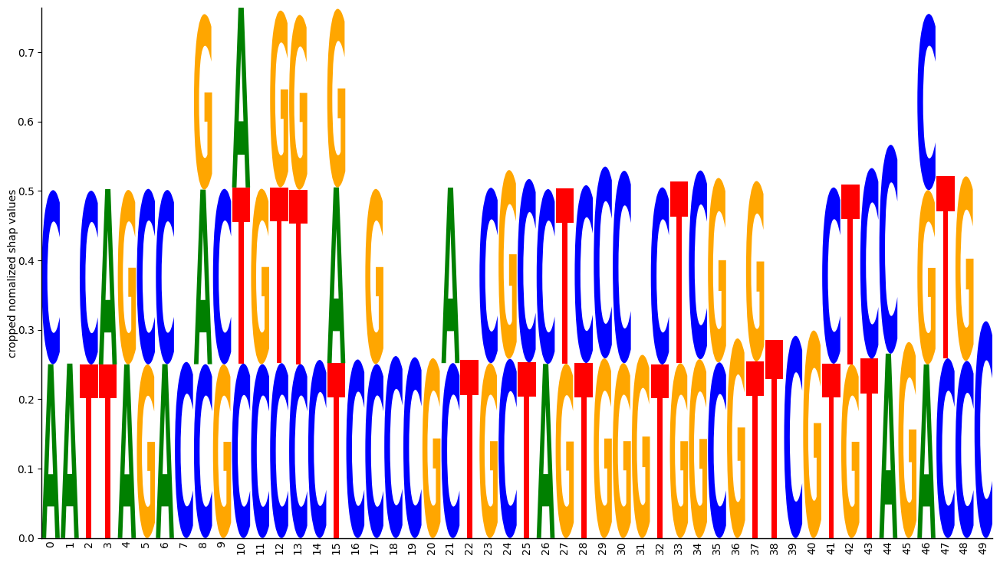

In [63]:
crp_logo = logomaker.Logo(crp_df3.iloc[:50,:],
                          shade_below=.5,
                          fade_below=.5,
                          font_name='Arial Rounded MT Bold',
                         figsize=(16,9))

# style using Logo methods
crp_logo.style_spines(visible=False)
crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)

# style using Axes methods
crp_logo.ax.set_ylabel("cropped nomalized shap values", labelpad=-1)
crp_logo.ax.xaxis.set_ticks_position('none')
crp_logo.ax.xaxis.set_tick_params(pad=-1)



# style and show figure
crp_logo.fig.show()

That's all the informations for this notebook. If you still have more issues, please fell free to connect us at ljs@swmu.edu.cn, thanks.